In [1]:
import scanpy as sc
import pandas as pd
from anndata import AnnData
from pathlib import Path
import json
from matplotlib.image import imread

from step import scModel, stModel
from step.utils.misc import read_visium_hd

sc.set_figure_params(dpi=150, figsize=(6, 4.5))

/projects/82505004-e7a0-445f-ab3c-80d03c91438f/.cache/pypoetry/virtualenvs/step-Ajq_Bw_i-py3.10/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Visium HD Human Colorectal Cancer (16 um) cell type clustering & spatial domain identification

## 16 um bin size: cell type clustering

In [ ]:
adata = read_visium_hd("./data/visium-hd/human-coloretal-cancer/square_016um/")

In [3]:
stepc = scModel(
    adata=adata,
    n_top_genes=2000,
)

Trying seurat_v3 for hvgs
not log_transformed
Adding count data to layer 'counts'
================Dataset Info================
Batch key: None 
Class key: None 
Number of Batches: 1 
Number of Classes: None 
Gene Expr: (136984, 2000)


In [4]:
stepc.run(epochs=400, batch_size=2048, beta=1e-3)

Performing global random split
Current Mode: single_batch: ['gene_expr']
 50%|█████     | 202/400 [18:05<17:43,  5.37s/epoch, kl_loss=0.956, recon_loss=460.729, val_kl_loss=0.967/0.498, val_recon_loss=458.524/457.657]


EarlyStopping counter: 30 out of 30
EarlyStopping counter: 202 out of 10


In [5]:
adata = stepc.adata

sc.pp.neighbors(adata, use_rep='X_rep', n_neighbors=60)
sc.tl.umap(adata)

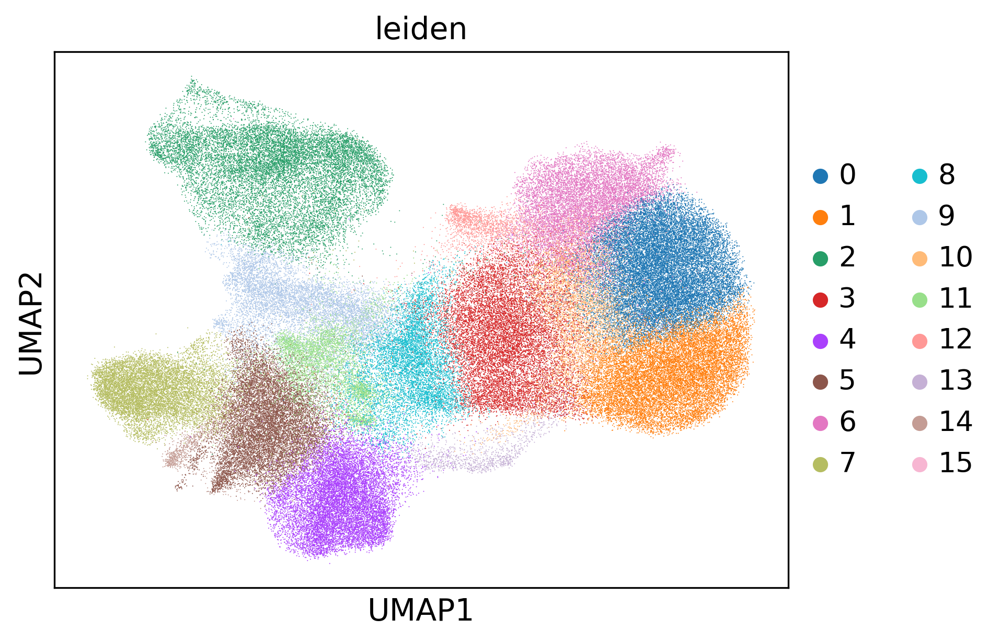

In [6]:
sc.tl.leiden(adata)
sc.pl.umap(adata, color='leiden')

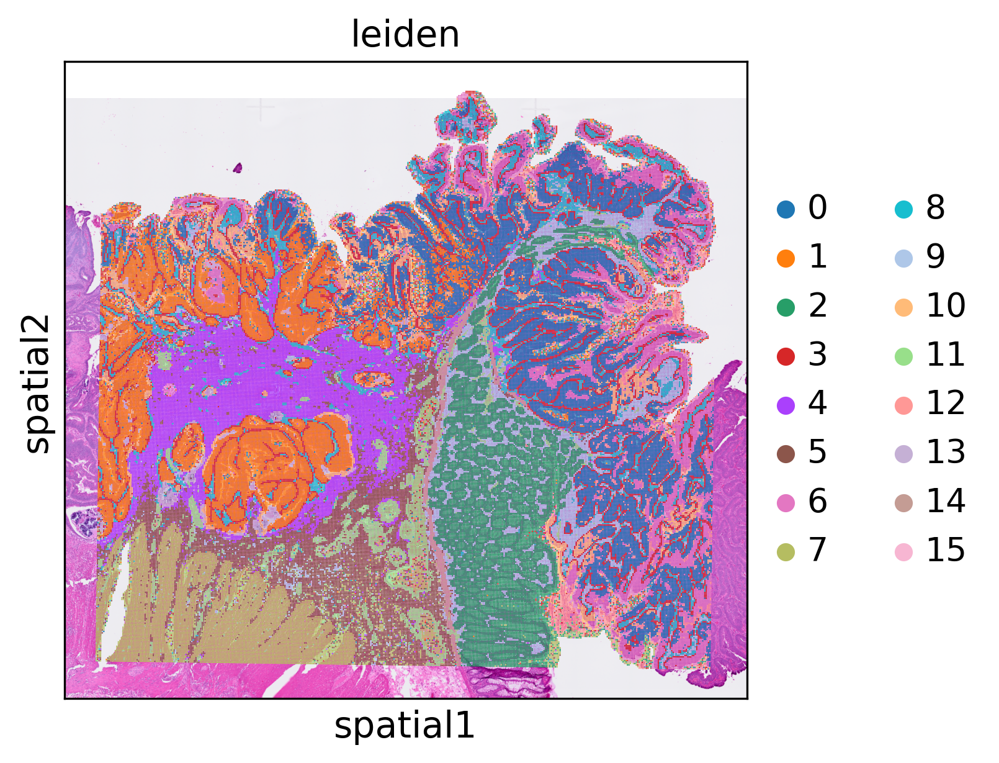

In [7]:
sc.pl.spatial(adata, color='leiden')

In [8]:
stepc.save("./results/visium-hd/hcc-16um/")
adata.write_h5ad("./results/visium-hd/hcc_16um.h5ad")

Saving model...
Saving model config...
Saving dataset config...


In [2]:
adata = sc.read_h5ad("./results/visium-hd/hcc_16um.h5ad")
# sc.set_figure_params(dpi=300, dpi_save=300)
# sc.settings.figdir = './results/visium-hd/hcc-16um/'

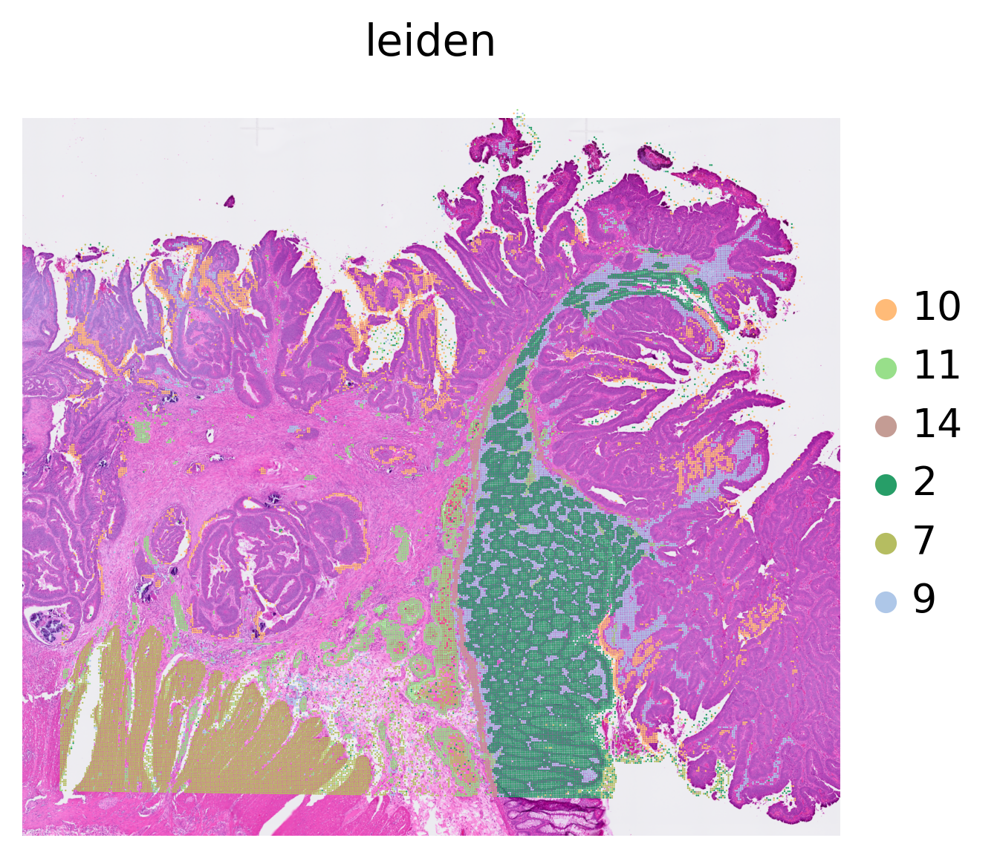

In [6]:
sc.pl.spatial(adata, color='leiden', frameon=False, groups=['7', '11', '14', '2', '9', '10'], na_in_legend=False)

In [3]:
sc.settings.figdir = "./results/visium-hd/hcc-16um/"
sc.set_figure_params(dpi_save=300)

In [4]:
sc.tl.rank_genes_groups(adata, groupby='leiden', dendrogram=False, use_raw=True)
sc.tl.dendrogram(adata, use_raw=True, groupby='leiden')

         Falling back to preprocessing with `sc.pp.pca` and default params.


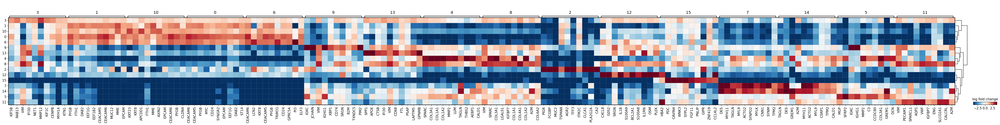

In [5]:
sc.pl.rank_genes_groups_matrixplot(adata, 
                                   groupby='leiden', 
                                   values_to_plot='logfoldchanges',
                                   cmap='RdBu_r',
                                   vmin=-4, vmax=4, 
                                   save='16um_leiden.svg')

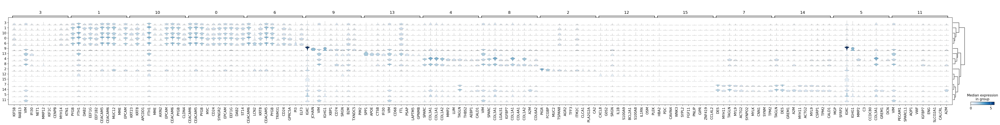

In [9]:
sc.pl.rank_genes_groups_stacked_violin(adata, 
                                       groupby='leiden',  
                                       save='_16um_leiden.svg')

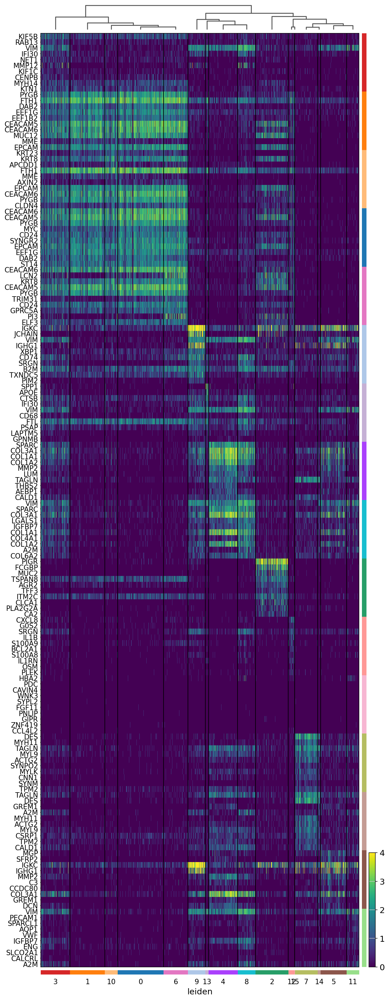

In [12]:
sc.pl.rank_genes_groups_heatmap(adata, 
                                groupby='leiden', 
                                n_genes=10, 
                                swap_axes=True, 
                                vmax=4,
                                show_gene_labels=True, 
                                save='_16um_leiden.svg')

## 16 um bin size: spatial domain identification

In [2]:
adata = read_visium_hd("./data/visium-hd/human-coloretal-cancer/square_016um/")

In [3]:
stepc = stModel(
    adata=adata,
    n_top_genes=3000,
    edge_clip=2,
    n_glayers=3,
)

Trying seurat_v3 for hvgs
not log_transformed
Adding count data to layer 'counts'
Dataset Done
================Dataset Info================
Batch key: None 
Class key: None 
Number of Batches: 1 
Number of Classes: None 
Gene Expr: (136984, 3000)


In [4]:
stepc.run(n_iterations=4000, n_samples=2048, beta=1e-5)

Training with e2e pattern
Training graph with single batch
Constructing graph for batch
100%|██████████| 4000/4000 [06:14<00:00, 10.67step/s, recon_loss=1340.246, kl_loss=0.002, contrast_loss=1.701, graph_ids=None]


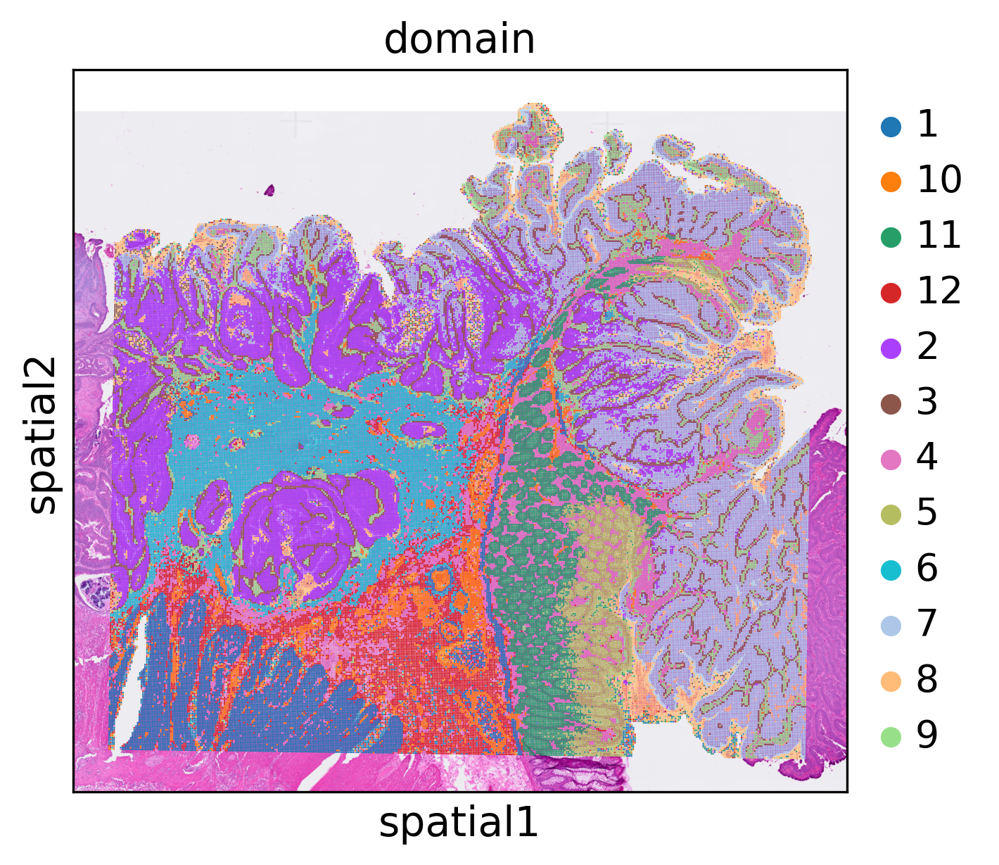

In [5]:
stepc.cluster(n_clusters=12)
stepc.spatial_plot(color='domain',)
stepc.save("./results/visium-hd/hccspatial_plotomain/")

Trying seurat_v3 for hvgs
Adding count data to layer 'counts'
Dataset Done
================Dataset Info================
Batch key: None 
Class key: None 
Number of Batches: 1 
Number of Classes: None 
Gene Expr: (136984, 3000)
Loading backbone model...
Backbone model loaded.


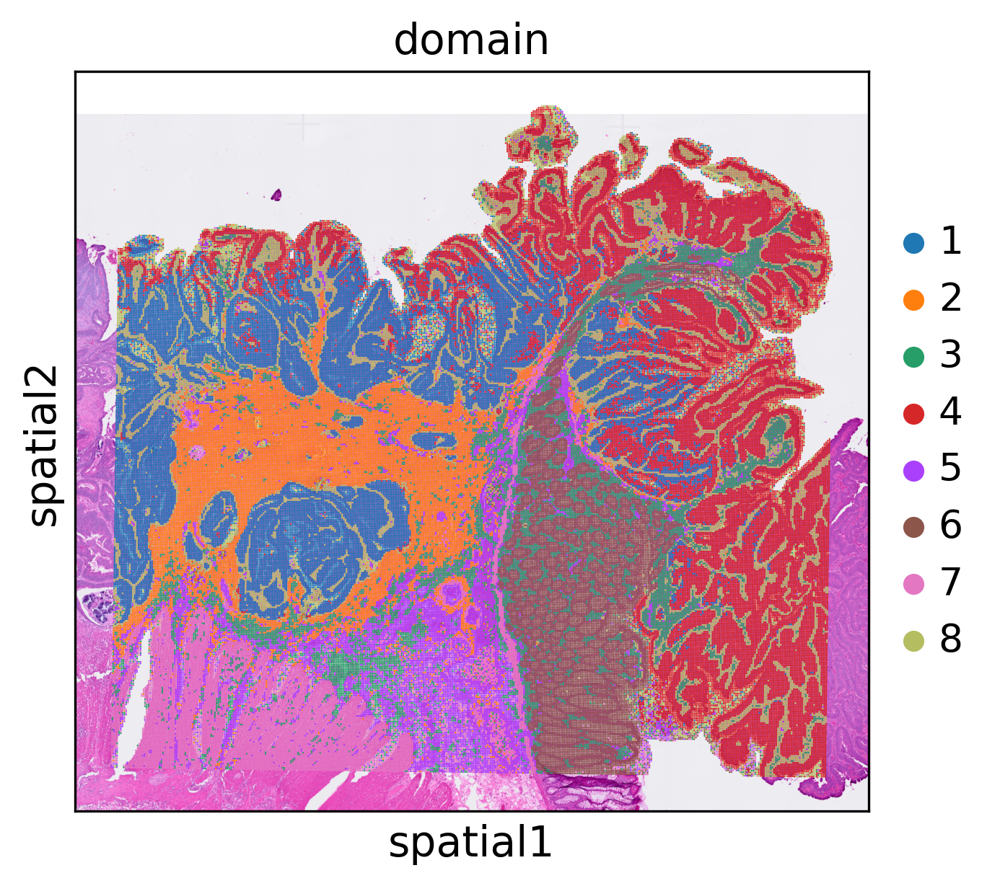

In [8]:
stepc = stModel.load("./results/visium-hd/hccspatial_plotomain/",
                           filepath="./results/visium-hd/hcc_16um_domain.h5ad")
stepc.adata.obsm['X_smoothed'] = stepc.gembed()
stepc.cluster(n_clusters=8)
stepc.spatial_plot(color='domain',)

In [9]:
stepc.adata.write_h5ad("./results/visium-hd/hcc_16um_domain.h5ad")

In [2]:
adata = sc.read_h5ad("./results/visium-hd/hcc_16um_domain.h5ad")

In [3]:
sc.settings.figdir = "./results/visium-hd/hcc-16um/"
sc.set_figure_params(dpi_save=300, figsize=(12, 9))

sc.pl.spatial(adata, color='domain', frameon=False, show=False, save='_16um_domain.svg',)

In [4]:
adata_raw = adata.raw.to_adata()
sc.pp.log1p(adata_raw)
adata.raw = adata_raw

In [5]:
# adata = stepc.adata

sc.tl.rank_genes_groups(adata, groupby='domain', dendrogram=False, use_raw=True)
sc.tl.dendrogram(adata, use_raw=True, groupby='domain')

         Falling back to preprocessing with `sc.pp.pca` and default params.


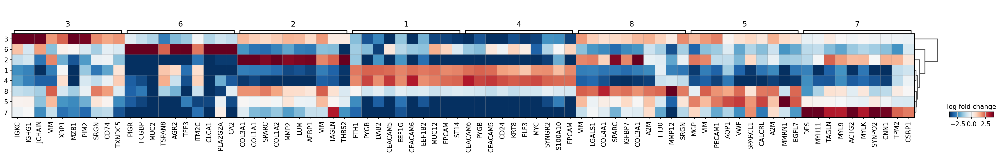

In [22]:
sc.pl.rank_genes_groups_matrixplot(adata, 
                                   groupby='domain', 
                                   values_to_plot='logfoldchanges',
                                   cmap='RdBu_r',
                                   vmin=-4, vmax=4, 
                                   save='16um_domain.svg')

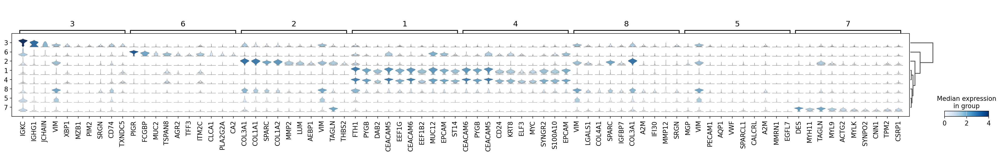

In [7]:
sc.pl.rank_genes_groups_stacked_violin(adata, 
                                       groupby='domain', 
                                       vmax=4,
                                       save='16um_domain.svg')

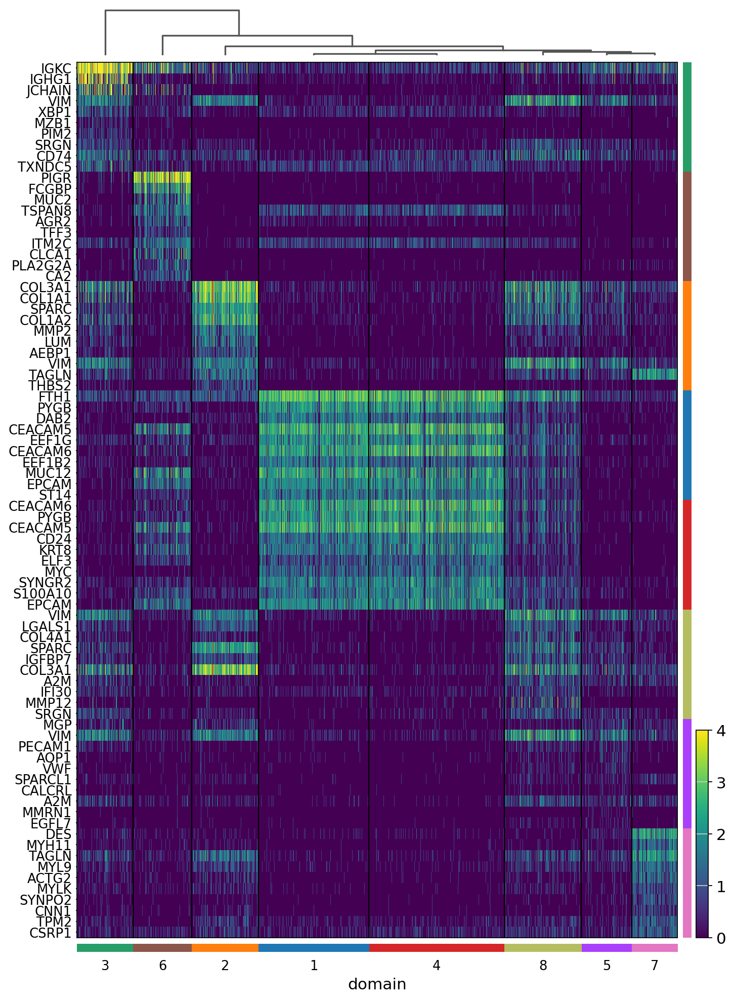

In [23]:
sc.pl.rank_genes_groups_heatmap(adata, 
                                groupby='domain', 
                                n_genes=10, 
                                swap_axes=True, 
                                vmax=4,
                                show_gene_labels=True, 
                                save='_16um_domain.svg')